# Read sea ice data and orbital parameters

In [1]:
import pandas as pd
import numpy as np

# load orbital parameters
path='D:/VScode/EBM_NH_SH_sea_ice/orb_paras/'
# read the Pre_0_1Ma_inter100.txt, which does not have columns names
df_pre=pd.read_csv(path+'Pre_0_1Ma_inter100.txt',sep='\s+',header=None)
# rename the columns
df_pre.columns=['age','pre']

df_obl=pd.read_csv(path+'Obl_0_1Ma_inter100.txt',sep='\s+',header=None)
df_obl.columns=['age','obl']


df_pre['age']=df_pre['age']*-1
df_obl['age']=df_obl['age']*-1
# filp the columns up-down
df_pre=df_pre[::-1]
df_obl=df_obl[::-1]



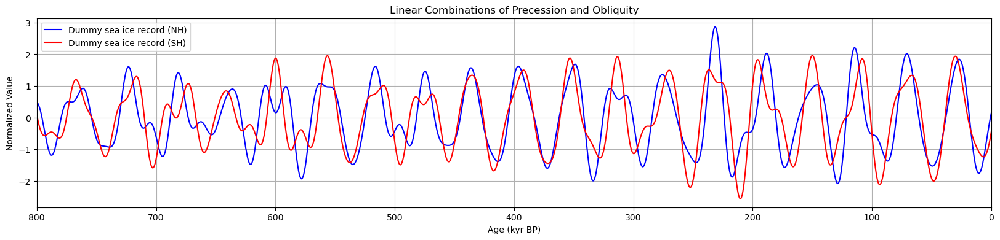

In [2]:
import numpy as np
from scipy.stats import zscore
import matplotlib.pyplot as plt

# Define the coefficients for NH and SH
coe_pre_nh = 0.4
coe_obl_nh = -0.9
coe_pre_sh = -0.4
coe_obl_sh = -0.9

# Create linear combinations for NH and SH
linear_comb_nh = coe_pre_nh * zscore(df_pre['pre']) + coe_obl_nh * zscore(df_obl['obl'])
linear_comb_sh = coe_pre_sh * zscore(df_pre['pre']) + coe_obl_sh * zscore(df_obl['obl'])

# Create figure and axis
plt.figure(figsize=(20, 4))

# Plot NH and SH linear combinations
plt.plot(df_pre['age'], linear_comb_nh, label='Dummy sea ice record (NH)', color='blue')
plt.plot(df_pre['age'], linear_comb_sh, label='Dummy sea ice record (SH)', color='red')

# Set labels and title
plt.xlabel('Age (kyr BP)')
plt.ylabel('Normalized Value')
plt.title('Linear Combinations of Precession and Obliquity')
plt.legend()

# set x-axis range
plt.xlim(0, 800)
# invert the x-axis
plt.gca().invert_xaxis()
# Show plot
plt.grid(True)
plt.show()


C:\Users\User\AppData\Local\Temp\ipykernel_8776\1620826673.py:119: UserWarning: FixedFormatter should only be used together with FixedLocator
  axs[0].set_xticklabels([str(int(-1 * x)) for x in axs[0].get_xticks()])
C:\Users\User\AppData\Local\Temp\ipykernel_8776\1620826673.py:120: UserWarning: FixedFormatter should only be used together with FixedLocator
  axs[1].set_xticklabels([str(int(-1 * x)) for x in axs[1].get_xticks()])


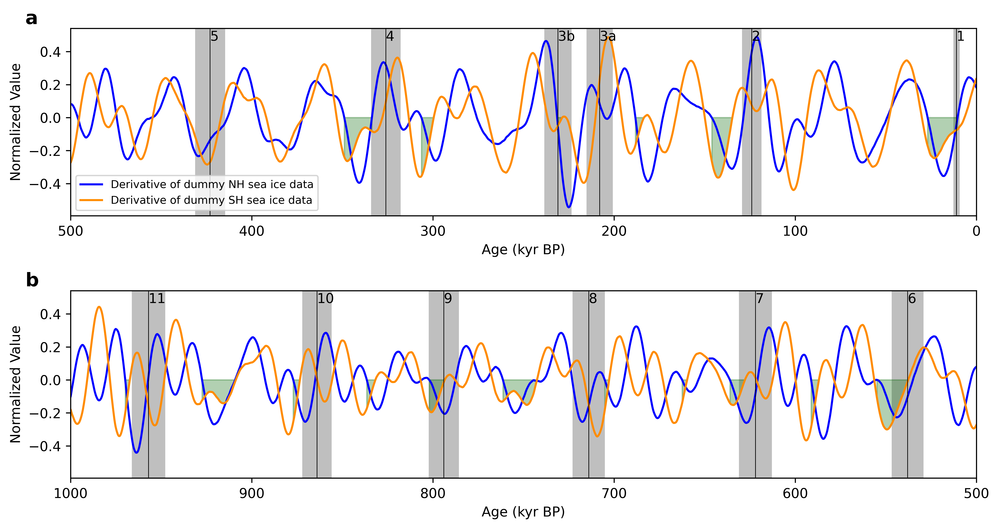

In [5]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.stats import zscore

# Assuming df_pre and df_obl are already defined and loaded as in your previous code snippets

# Define the coefficients for NH and SH
coe_pre_nh = 0.4
coe_obl_nh = -0.9
coe_pre_sh = -0.4
coe_obl_sh = -0.9

# Create linear combinations for NH and SH
linear_comb_nh = coe_pre_nh * zscore(df_pre['pre']) + coe_obl_nh * zscore(df_obl['obl'])
linear_comb_sh = coe_pre_sh * zscore(df_pre['pre']) + coe_obl_sh * zscore(df_obl['obl'])

# timing of the terminations, data from Huybers et al., 2011 doi:10.1038/nature10626
Tt = np.array([-957, -864, -794, -714, -622, -538, -423, -326, -231, -208, -124, -11])
Tt_unc_sigleside = np.array([9.19599874163397, 8.11472231168675, 8.29531938444627, 8.90935954302480, 9.05842898966959, 8.80897810886163, 8.31862132608857, 8.17091882229411, 7.55216739617228, 7.25855162019460, 5.37345911115918, 1.77207101844172])
Tt_labels=['11','10','9','8','7','6','5','4','3b','3a','2','1']

# Calculate derivatives
deriv_nh = np.gradient(linear_comb_nh, -1 * df_pre['age'])  # Negate age axis for paleoclimate records
deriv_sh = np.gradient(linear_comb_sh, -1 * df_pre['age'])

neg_indices_nh = np.where(deriv_nh < 0)[0]
neg_indices_sh = np.where(deriv_sh < 0)[0]
###########################
# # Find where derivatives are negative
# neg_chunks_nh=np.split(neg_indices_nh, np.where(np.diff(neg_indices_nh) != 1)[0] + 1)
# neg_chunks_sh=np.split(neg_indices_sh, np.where(np.diff(neg_indices_sh) != 1)[0] + 1)

# sh_lead_indices = []

# for chunk_sh in neg_chunks_sh:
#     for chunk_nh in neg_chunks_nh:
#         left_index = chunk_nh[-1]+1
#         if left_index in chunk_sh:

#             sh_lead_indices.append(chunk_sh)

# sh_lead_indices = np.concatenate(sh_lead_indices)

######################

# Find overlapping negative areas
overlapping_indices = np.intersect1d(neg_indices_nh, neg_indices_sh)

# Find consecutive chunks of overlapping indices
chunks = np.split(overlapping_indices, np.where(np.diff(overlapping_indices) != 1)[0] + 1)

# Find indices where SH derivative negative phase comes earlier than NH within each chunk
sh_lead_indices = []
for chunk in chunks:
    left_index = chunk[-1]+1
    # print(left_index)
    if left_index in neg_indices_sh and left_index not in neg_indices_nh:
        sh_lead_indices.append(chunk)

# reshape early_sh_indices to 1D array
sh_lead_indices = np.concatenate(sh_lead_indices)
####################

# save the sh_lead_indices to '/Hypothesis_test/' as .npy file
np.save('D:/VScode/EBM_NH_SH_sea_ice/Hypothesis_test/sh_lead_indices.npy', sh_lead_indices)


# Create figure and subplots with 3 rows
fig, axs = plt.subplots(2, 1, figsize=(12, 6), dpi=600)


axs[0].plot(-1 * df_pre['age'], deriv_nh, label='Derivative of dummy NH sea ice data', color='blue')
axs[0].plot(-1 * df_pre['age'], deriv_sh, label='Derivative of dummy SH sea ice data', color='darkorange')
# This assumes `sh_lead_indices` calculation is correctly defined elsewhere in your code
axs[0].fill_between(-1 * df_pre['age'], deriv_sh, where=np.isin(np.arange(len(deriv_sh)), sh_lead_indices), color='darkgreen', alpha=0.3)
# set x-axis range
axs[0].set_xlim(-500,0)
axs[0].legend(fontsize=8)

# Bottom subplot for derivatives with highlighted sections
# Assuming the code to calculate sh_lead_indices is correct and included before this plot code
axs[1].plot(-1 * df_pre['age'], deriv_nh, label='Derivative of dummy NH sea ice data', color='blue')
axs[1].plot(-1 * df_pre['age'], deriv_sh, label='Derivative of dummy SH sea ice data', color='darkorange')
# This assumes `sh_lead_indices` calculation is correctly defined elsewhere in your code
axs[1].fill_between(-1 * df_pre['age'], deriv_sh, where=np.isin(np.arange(len(deriv_sh)), sh_lead_indices), color='darkgreen', alpha=0.3)
# set x-axis range
axs[1].set_xlim(-1000,-500)
# axs[1].legend()

# plot labels for Tt

for i in range(6):
    axs[0].text(Tt[i+6], 0.45, Tt_labels[i+6], fontsize=10, verticalalignment='bottom', horizontalalignment='left')
    axs[1].text(Tt[i], 0.45, Tt_labels[i], fontsize=10, verticalalignment='bottom', horizontalalignment='left')


for t, unc in zip(Tt, Tt_unc_sigleside):
    axs[0].axvspan(t - unc, t + unc, color='gray', alpha=0.5, zorder=0, linewidth=0)
    axs[0].axvline(x=t, color='black', linestyle='-', linewidth=0.5)

    axs[1].axvspan(t - unc, t + unc, color='gray', alpha=0.5, zorder=0, linewidth=0)
    axs[1].axvline(x=t, color='black', linestyle='-', linewidth=0.5)



# Set common labels and legend for the middle and bottom subplots
for ax in axs:
    ax.set_xlabel('Age (kyr BP)')
    ax.set_ylabel('Normalized Value')
    # ax.set_ylabel('Derivative of Linear Combination')
    # ax.legend()
    # ax.set_xlim(-1000, 0)

# add text a and b to the subplots with bold font
axs[0].text(-0.05, 1.1, 'a', transform=axs[0].transAxes, fontsize=14, fontweight='bold', va='top')
axs[1].text(-0.05, 1.1, 'b', transform=axs[1].transAxes, fontsize=14, fontweight='bold', va='top')

# set the xtick labels to be xticks*-1
axs[0].set_xticklabels([str(int(-1 * x)) for x in axs[0].get_xticks()])
axs[1].set_xticklabels([str(int(-1 * x)) for x in axs[1].get_xticks()])
# adjust vertical space between subplots
plt.subplots_adjust(hspace=0.4)
# Adjust layout
# plt.tight_layout()
plt.show()


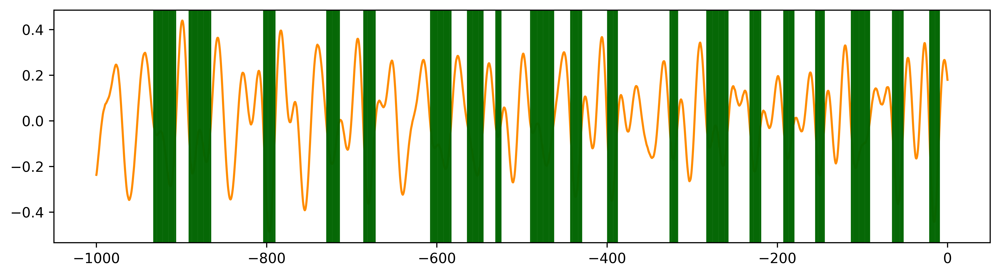

In [85]:

sh_lead_indices=len(df_pre['age'].values)-sh_lead_indices

fig, ax = plt.subplots(1, 1, figsize=(12, 3), dpi=600)

ax.plot(-1 * df_pre['age'], deriv_sh, label='Derivative of dummy SH sea ice data', color='darkorange')
# plot vertical lines for ages at sh_lead_indices
for i in sh_lead_indices:
    ax.axvline(-1 * df_pre['age'][i], color='darkgreen', linestyle='-', linewidth=0.1)

# Hypothesis test

# H0: the terminations is independent to the the leading SH insolation forcing

In [6]:
# load sh_lead_indices
sh_lead_indices = np.load('D:/VScode/EBM_NH_SH_sea_ice/Hypothesis_test/sh_lead_indices.npy')
df_obl=pd.read_csv(path+'Obl_0_1Ma_inter100.txt',sep='\s+',header=None)
df_obl.columns=['age','obl']

sh_lead_indices=len(df_obl['age'].values)-sh_lead_indices

sh_lead_ages=df_obl.iloc[sh_lead_indices]['age'].values
sh_lead_ages

Tt = np.array([-957, -864, -794, -714, -622, -538, -423, -326, -231, -208, -124, -11])

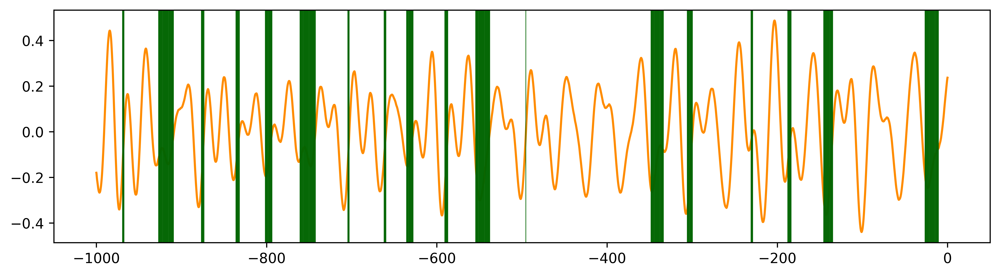

In [7]:

fig, ax = plt.subplots(1, 1, figsize=(12, 3), dpi=600)

ax.plot(-1 * df_pre['age'], deriv_sh, label='Derivative of dummy SH sea ice data', color='darkorange')
# plot vertical lines for ages at sh_lead_indices
for i in sh_lead_indices:
    ax.axvline(-1 * df_pre['age'][i], color='darkgreen', linestyle='-', linewidth=0.1)

In [90]:
sh_lead_indices

array([9909, 9908, 9907, ...,  670,  669,  668], dtype=int64)

-26.8
-145.9
-188.1
-306.2
-348.8
-554.8
-591.1
-635.9
-761.2
-801.9
-836.4
-877.0
-927.3


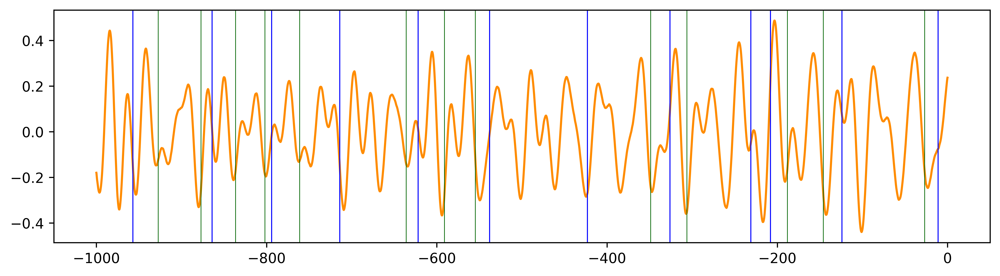

In [14]:
sh_lead_indices_chunks=np.split(sh_lead_indices, np.where(np.diff(sh_lead_indices) != -1)[0] + 1)

fig, ax = plt.subplots(1, 1, figsize=(12, 3), dpi=600)

ax.plot(-1 * df_pre['age'], deriv_sh, label='Derivative of dummy SH sea ice data', color='darkorange')

# plot Tt
for t in Tt:
    ax.axvline(t, color='blue', linestyle='-', linewidth=0.7)

chunk_left_ages=[]
for chunk in sh_lead_indices_chunks:
    # print(chunk)
    # print(chunk[0])
    # break
    if abs(chunk[0]-chunk[-1])<30:
        continue
    left_index = chunk[-1]
    chunk_left_age = df_obl.iloc[left_index]['age']
    print(chunk_left_age)
    chunk_left_ages.append(chunk_left_age)
    # plot vertical lines for ages at chunk_left_age
    ax.axvline(-1 * df_pre['age'][left_index], color='darkgreen', linestyle='-', linewidth=0.5)
#     # break

# # save the chunk_left_ages to '/Hypothesis_test/' as .npy file
# np.save('D:/VScode/EBM_NH_SH_sea_ice/Hypothesis_test/chunk_left_ages.npy', chunk_left_ages)

# Randomly choose len(Tt) terminations, and calculate its distance to the SH lead

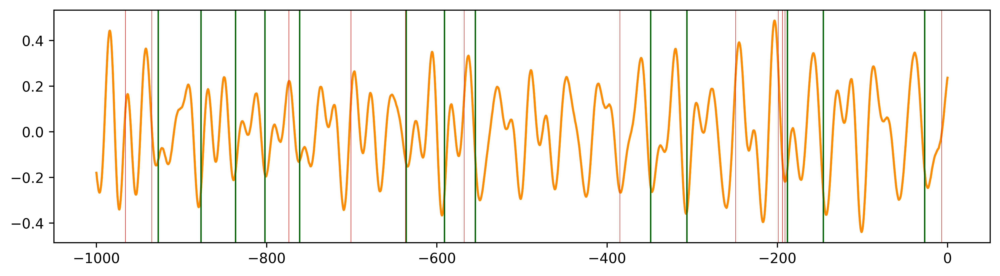

In [15]:
import numpy as np
import pandas as pd


# 1. In sh_lead_ages, randomly choose len(T) samples as the random_sh_lead
# np.random.seed(0) # For reproducibility
len_T = len(Tt)
random_T = -1*np.random.choice(range(1001), len_T, replace=False)


fig, ax = plt.subplots(1, 1, figsize=(12, 3), dpi=600)

ax.plot(-1 * df_pre['age'], deriv_sh, label='Derivative of dummy SH sea ice data', color='darkorange')
# plot vertical lines for ages at random_T
for i in chunk_left_ages:
    ax.axvline(i, color='darkgreen', linestyle='-', linewidth=0.99)

# # plot Tt
for t in random_T:
    ax.axvline(t, color='r', linestyle='-', linewidth=0.32)




[13.0, 7.899999999999977, 47.200000000000045, 13.899999999999977, 16.799999999999955, 74.19999999999999, 19.80000000000001, 42.900000000000006, 19.900000000000006, 21.900000000000006, 15.8]


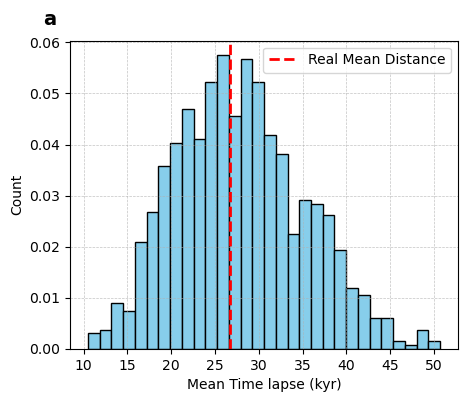

16.781227272727268

In [17]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt



# 1. Randomly choose len(Tt) values from 0 to 1000 for 1000 loops
random_samples = [-1*np.random.choice(range(1001), size=len(Tt), replace=False) for _ in range(1000)]

def calculate_mean_distance(random_Tt, chunk_left_ages, if_print=False):
    mean_distances = []
    for T in random_Tt:
        # only choose chunk_left_ages with abs values lager than abs(T)
        chunk_left_ages_sub = np.array([i for i in chunk_left_ages if abs(i) > abs(T)])
        if len(chunk_left_ages_sub)==0:
            continue
        # Find the closest chunk's leftmost value
        closest_distances = np.abs(chunk_left_ages - T)
        min_distance = np.min(closest_distances)
        mean_distances.append(min_distance)
    if if_print:
        print(mean_distances)
    return np.mean(mean_distances)

# 2. Calculate mean distance for each random sample
mean_distances = [calculate_mean_distance(sample, chunk_left_ages) for sample in random_samples]

plt.figure(figsize=(5, 4),dpi=100)
# 3. Plot the distribution of the mean distances
plt.hist(mean_distances, bins=30, color='skyblue', edgecolor='black', density=True)

# 4. Calculate and plot the distance of the real data

real_mean_distance = calculate_mean_distance(Tt, chunk_left_ages, if_print=True)
plt.axvline(real_mean_distance, color='r', linestyle='dashed', linewidth=2, label='Real Mean Distance')

plt.legend()
plt.xlabel('Mean Time lapse (kyr)')
plt.ylabel('Count')
# Adding grid lines for better readability
plt.grid(True, which='both', linestyle='--', linewidth=0.5, alpha=0.75)
# add a text a to the plot with bold font
plt.text(-0.07, 1.1, 'a', transform=plt.gca().transAxes, fontsize=14, fontweight='bold', va='top')

# Adding legend with improved readability
plt.legend(fontsize=10)
# plt.title('Distribution of Mean Distances and Real Data Mean Distance')
plt.show()

# print the 5% quantile of the mean_distances
np.quantile(mean_distances, 0.05)


# H1: the terminations is dependent to the the leading SH insolation forcing

In [198]:
# load sh_lead_indices
sh_lead_indices = np.load('D:/VScode/EBM_NH_SH_sea_ice/Hypothesis_test/sh_lead_indices.npy')
df_obl=pd.read_csv(path+'Obl_0_1Ma_inter100.txt',sep='\s+',header=None)
df_obl.columns=['age','obl']

sh_lead_indices=len(df_obl['age'].values)-sh_lead_indices

sh_lead_ages=df_obl.iloc[sh_lead_indices]['age'].values
sh_lead_ages

Tt = np.array([-957, -864, -794, -714, -622, -538, -423, -326, -231, -208, -124, -11])

In [249]:
mean_distances = []
for T in Tt:
    print (T)
    chunk_left_ages_sub = np.array([i for i in chunk_left_ages if abs(i) > abs(T)])
    if len(chunk_left_ages_sub)==0:
        continue
    # Find the closest chunk's leftmost value
    closest_distances = np.abs(chunk_left_ages - T)
    min_distance = np.min(closest_distances)
    mean_distances.append(min_distance)

mean_distances
# prin the max and min of the mean_distances 
print('max:',max(mean_distances))
print('min:',min(mean_distances))
print('mean:',np.mean(mean_distances))

-957
-864
-794
-714
-622
-538
-423
-326
-231
-208
-124
-11
max: 27.700000000000045
min: 0.6999999999999886
mean: 12.118181818181824


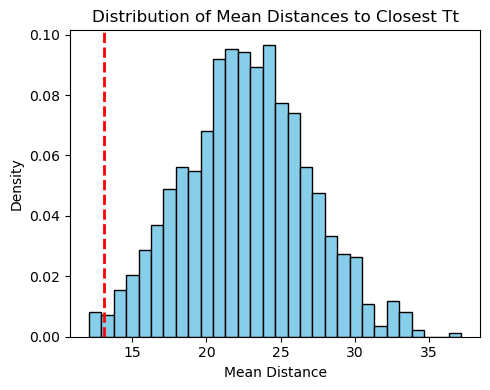

15.69166666666669


In [252]:
import matplotlib.pyplot as plt
import numpy as np

# Placeholder for Tt for completeness of this example
Tt = np.array([-957, -864, -794, -714, -622, -538, -423, -326, -231, -208, -124, -11])

# Placeholder for sh_lead_ages
sh_lead_ages = -1 * df_pre['age'].values  # Example conversion based on user's approach

mean_distances = []  # Store mean distances here

for _ in range(1000):  # Repeat the process 1000 times
    # 1. Randomly choose len(Tt) samples from sh_lead_ages as pure_rand_t
    rand_lead = np.random.choice(sh_lead_ages, len(Tt), replace=False)
    
    # 2. Calculate the distances to the closest Tt and the mean of all distances
    distances = [np.min(np.abs(t - Tt)) for t in rand_lead]
    mean_distance = np.mean(distances)
    
    mean_distances.append(mean_distance)

# Plot the distribution of mean distances
plt.figure(figsize=(5,4), dpi=100)
plt.hist(mean_distances, bins=30, color='skyblue', edgecolor='black', density=True)
# plot a vertical line for the real mean distance, which is 13.091666666666669
plt.axvline(13.091666666666669, color='r', linestyle='dashed', linewidth=2, label='Real Mean Distance')

plt.title('Distribution of Mean Distances to Closest Tt')
plt.xlabel('Mean Distance')
plt.ylabel('Density')

# Show the plot
plt.tight_layout()
plt.show()

# print the 5%th percentile of the mean_distances
print(np.percentile(mean_distances, 5))



In [2]:
# print a file name list for files edding with .pdf of D:\论文-同步-Dell-XPS13-2022-11-03
import os
path='D:/论文-同步-Dell-XPS13-2022-11-03/'
file_list=os.listdir(path)
for file in file_list:
    if file.endswith('.pdf'):
        print(file)


Abram JN et al-2016-Nature-Early onset of industrial-era warming across the oceans and continents.pdf
Ahn J et al-2008-J. Glaciology-CO2 diffusion in polar ice.pdf
Ahn J et al-2012-GRL-Abrupt change in atmospheric CO2 during the last ice age.pdf
Ahn J&Brook EJ-2008-Science-Atmospheric CO2 and Climate on Millennial Time Scales During the Last Glacial Period.pdf
Ahn J&Brook EJ-2008-Science-SOM.pdf
Ahn j&Brook EJ-2014-Nature com-Siple Dome ice reveals two modes of millennial CO2 change during the last ice age.pdf
Ai XE et al.-2020-Science-Southern Ocean upwelling, Earth’s obliquity,and glaicial-interglacial atmospheric CO2 change.pdf
Allen CS et al-2011-QSR-Last glacial–interglacial sea-ice cover in the SW Atlantic and its potential role in global deglaciation.pdf
Allen KA et al-2015-QSR-outhwest Pacific deep water carbonate chemistry.pdf
Alvarez-Solas et al-2011-GPC-Millennial-scale oscillations in the Southern Ocean in response to atmospheric CO2 increase.pdf
Anderson HJ et al.-2021-QSR

24.708333333333332

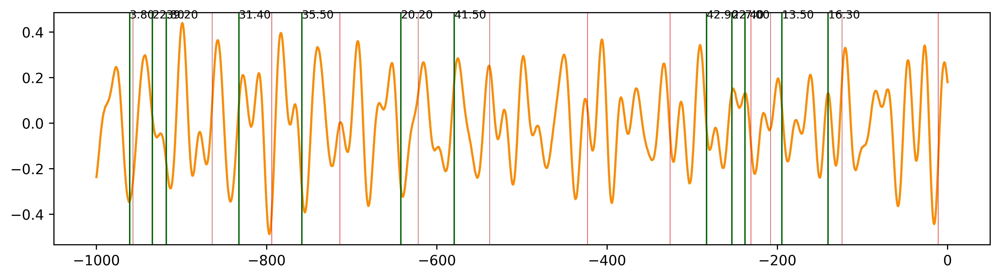

In [256]:
import numpy as np
import pandas as pd


# 1. In sh_lead_ages, randomly choose len(T) samples as the random_sh_lead
# np.random.seed(0) # For reproducibility
len_T = len(Tt)
random_sh_lead_age = np.random.choice(sh_lead_ages, len_T, replace=False)


fig, ax = plt.subplots(1, 1, figsize=(12, 3), dpi=600)

ax.plot(-1 * df_pre['age'], deriv_sh, label='Derivative of dummy SH sea ice data', color='darkorange')
# plot vertical lines for ages at random_T
for i in random_sh_lead_age:
    ax.axvline(i, color='darkgreen', linestyle='-', linewidth=0.99)

# # plot Tt
for t in Tt:
    ax.axvline(t, color='r', linestyle='-', linewidth=0.32)


    
# Find the distances between the random_T and the closest Tt
distances = [np.min(np.abs(t - Tt)) for t in random_sh_lead_age]



# print the distances on the plot near the random_T
for i, d in zip(random_sh_lead_age, distances):
    ax.text(i, 0.45, f'{d:.2f}', fontsize=8, verticalalignment='bottom', horizontalalignment='left')

# 4. Calculate the mean of the distance in step 3
mean_distance = np.mean(distances)
mean_distance



19.166939663060422

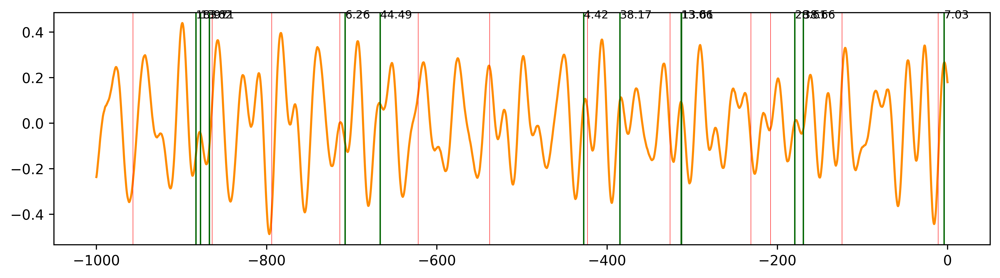

In [196]:
import numpy as np
import pandas as pd


# 1. In sh_lead_ages, randomly choose len(T) samples as the random_sh_lead
# np.random.seed(0) # For reproducibility
len_T = len(Tt)
random_sh_lead_age = np.random.choice(sh_lead_ages, len_T, replace=False)

# 2. For each random_sh_lead, randomly choose a value from random_sh_lead+0.69 to random_sh_lead+27.7 as the random_T
random_T = np.array([np.random.uniform(low=lead+0.69, high=lead+27.7) for lead in random_sh_lead_age])


fig, ax = plt.subplots(1, 1, figsize=(12, 3), dpi=600)

ax.plot(-1 * df_pre['age'], deriv_sh, label='Derivative of dummy SH sea ice data', color='darkorange')
# plot vertical lines for ages at random_T
for i in random_T:
    ax.axvline(i, color='darkgreen', linestyle='-', linewidth=0.99)

# # plot Tt
for t in Tt:
    ax.axvline(t, color='r', linestyle='-', linewidth=0.32)

# find the distances between the random_T and the closest Tt
# distances = np.abs(random_T - Tt)
    
# Find the distances between the random_T and the closest Tt
distances = [np.min(np.abs(t - Tt)) for t in random_T]



# print the distances on the plot near the random_T
for i, d in zip(random_T, distances):
    ax.text(i, 0.45, f'{d:.2f}', fontsize=8, verticalalignment='bottom', horizontalalignment='left')

# 4. Calculate the mean of the distance in step 3
mean_distance = np.mean(distances)
mean_distance




[-189.24934583 -780.67057742 -253.6812198  -470.10170369  -91.70362413
 -522.36504475 -693.7693089  -260.39807781 -774.07771063 -619.96785241
 -717.11908118 -822.31740342]


21.067835153733125

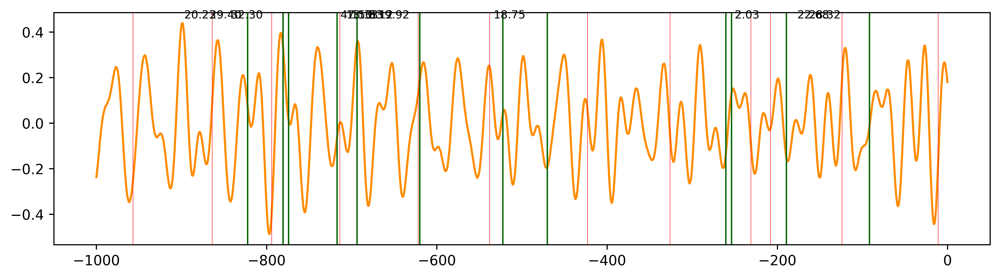

In [165]:

# Modified section for calculating distances to find the closest Tt for each random_T
# np.random.seed(0)  # For reproducibility
len_T = len(Tt)
random_sh_lead_age = np.random.choice(sh_lead_ages, len_T, replace=False)

# randomly choose len_T values from -1000 to 0 
pure_random_T = np.random.uniform(-1000, 0, len_T)
print(pure_random_T)

fig, ax = plt.subplots(1, 1, figsize=(12, 3), dpi=600)

ax.plot(-1 * df_pre['age'], deriv_sh, label='Derivative of dummy SH sea ice data', color='darkorange')
# plot vertical lines for ages at random_T
for i in pure_random_T:
    ax.axvline(i, color='darkgreen', linestyle='-', linewidth=0.99)

# # plot Tt
for t in Tt:
    ax.axvline(t, color='r', linestyle='-', linewidth=0.32)


distances = [np.min(np.abs(t - Tt)) for t in pure_random_T]

# print the distances on the plot near the random_T
for i, d in zip(random_T, distances):
    ax.text(i, 0.45, f'{d:.2f}', fontsize=8, verticalalignment='bottom', horizontalalignment='left')

# 4. Calculate the mean of the distance in step 3
mean_distance = np.mean(distances)
mean_distance


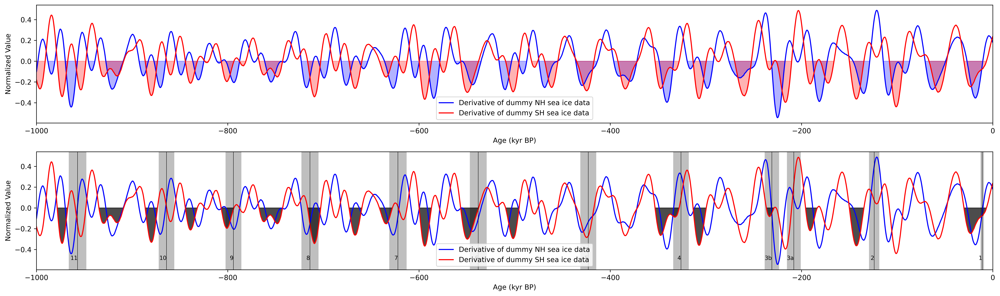

In [60]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.stats import zscore

# Assuming df_pre and df_obl are already defined and loaded as in your previous code snippets

# Define the coefficients for NH and SH
coe_pre_nh = 0.4
coe_obl_nh = -0.9
coe_pre_sh = -0.4
coe_obl_sh = -0.9

# Create linear combinations for NH and SH
linear_comb_nh = coe_pre_nh * zscore(df_pre['pre']) + coe_obl_nh * zscore(df_obl['obl'])
linear_comb_sh = coe_pre_sh * zscore(df_pre['pre']) + coe_obl_sh * zscore(df_obl['obl'])

# timing of the terminations, data from Huybers et al., 2011 doi:10.1038/nature10626
Tt = np.array([-957, -864, -794, -714, -622, -538, -423, -326, -231, -208, -124, -11])
Tt_unc_sigleside = np.array([9.19599874163397, 8.11472231168675, 8.29531938444627, 8.90935954302480, 9.05842898966959, 8.80897810886163, 8.31862132608857, 8.17091882229411, 7.55216739617228, 7.25855162019460, 5.37345911115918, 1.77207101844172])
Tt_labels=['11','10','9','8','7','6','5','4','3b','3a','2','1']

# Calculate derivatives
deriv_nh = np.gradient(linear_comb_nh, -1 * df_pre['age'])  # Negate age axis for paleoclimate records
deriv_sh = np.gradient(linear_comb_sh, -1 * df_pre['age'])

# Find where derivatives are negative
neg_indices_nh = np.where(deriv_nh < 0)[0]
neg_indices_sh = np.where(deriv_sh < 0)[0]

neg_chunks_nh=np.split(neg_indices_nh, np.where(np.diff(neg_indices_nh) != 1)[0] + 1)
neg_chunks_sh=np.split(neg_indices_sh, np.where(np.diff(neg_indices_sh) != 1)[0] + 1)

sh_lead_indices = []

for chunk_sh in neg_chunks_sh:
    for chunk_nh in neg_chunks_nh:
        left_index = chunk_nh[-1]+1
        if left_index in chunk_sh:
            sh_lead_indices.append(chunk_sh)

sh_lead_indices = np.concatenate(sh_lead_indices)

# Create figure and subplots with 3 rows
fig, axs = plt.subplots(2, 1, figsize=(20, 6), dpi=600)


# Middle subplot for derivatives
axs[0].plot(-1 * df_pre['age'], deriv_nh, label='Derivative of dummy NH sea ice data', color='blue')
axs[0].plot(-1 * df_pre['age'], deriv_sh, label='Derivative of dummy SH sea ice data', color='red')
axs[0].fill_between(-1 * df_pre['age'], deriv_nh, where=deriv_nh < 0, color='blue', alpha=0.3)
axs[0].fill_between(-1 * df_pre['age'], deriv_sh, where=deriv_sh < 0, color='red', alpha=0.3)
# axs[0].set_title('Negative Derivatives')

# Bottom subplot for derivatives with highlighted sections
# Assuming the code to calculate sh_lead_indices is correct and included before this plot code
axs[1].plot(-1 * df_pre['age'], deriv_nh, label='Derivative of dummy NH sea ice data', color='blue')
axs[1].plot(-1 * df_pre['age'], deriv_sh, label='Derivative of dummy SH sea ice data', color='red')
# This assumes `sh_lead_indices` calculation is correctly defined elsewhere in your code
axs[1].fill_between(-1 * df_pre['age'], deriv_sh, where=np.isin(np.arange(len(deriv_sh)), sh_lead_indices), color='k', alpha=0.7)

i=0
for t, unc in zip(Tt, Tt_unc_sigleside):
    axs[1].axvspan(t - unc, t + unc, color='gray', alpha=0.5, zorder=0, linewidth=0)
    axs[1].text(t, -0.5, Tt_labels[i], fontsize=8, ha='right')
    # add vertical lines at Tt
    axs[1].axvline(x=t, color='black', linestyle='-', linewidth=0.5)
    i+=1



# Set common labels and legend for the middle and bottom subplots
for ax in axs:
    ax.set_xlabel('Age (kyr BP)')
    ax.set_ylabel('Normalized Value')
    # ax.set_ylabel('Derivative of Linear Combination')
    ax.legend()
    ax.set_xlim(-1000, 0)

# Adjust layout
plt.tight_layout()
plt.show()


In [55]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.stats import zscore

# Assuming df_pre and df_obl are already defined and loaded as in your previous code snippets

# Define the coefficients for NH and SH
coe_pre_nh = 0.4
coe_obl_nh = -0.9
coe_pre_sh = -0.4
coe_obl_sh = -0.9

# Create linear combinations for NH and SH
linear_comb_nh = coe_pre_nh * zscore(df_pre['pre']) + coe_obl_nh * zscore(df_obl['obl'])
linear_comb_sh = coe_pre_sh * zscore(df_pre['pre']) + coe_obl_sh * zscore(df_obl['obl'])

# timing of the terminations, data from Huybers et al., 2011 doi:10.1038/nature10626
Tt = np.array([-957, -864, -794, -714, -622, -538, -423, -326, -231, -208, -124, -11])
Tt_unc_sigleside = np.array([9.19599874163397, 8.11472231168675, 8.29531938444627, 8.90935954302480, 9.05842898966959, 8.80897810886163, 8.31862132608857, 8.17091882229411, 7.55216739617228, 7.25855162019460, 5.37345911115918, 1.77207101844172])
Tt_labels=['11','10','9','8','7','6','5','4','3b','3a','2','1']

# Calculate derivatives
deriv_nh = np.gradient(linear_comb_nh, -1 * df_pre['age'])  # Negate age axis for paleoclimate records
deriv_sh = np.gradient(linear_comb_sh, -1 * df_pre['age'])

# Find where derivatives are negative
neg_indices_nh = np.where(deriv_nh < 0)[0]
neg_indices_sh = np.where(deriv_sh < 0)[0]

neg_chunks_nh=np.split(neg_indices_nh, np.where(np.diff(neg_indices_nh) != 1)[0] + 1)
neg_chunks_sh=np.split(neg_indices_sh, np.where(np.diff(neg_indices_sh) != 1)[0] + 1)

sh_lead_indices = []

for chunk_sh in neg_chunks_sh:
    for chunk_nh in neg_chunks_nh:
        left_index = chunk_nh[-1]+1
        if left_index in chunk_sh:
            sh_lead_indices.append(chunk_sh)

sh_lead_indices = np.concatenate(sh_lead_indices)

# Create figure and subplots with 3 rows
fig, axs = plt.subplots(3, 1, figsize=(20, 12), dpi=600)

# New top subplot for Linear Combinations of Precession and Obliquity
axs[0].plot(df_pre['age'], linear_comb_nh, label='Dummy sea ice record (NH)', color='blue')
axs[0].plot(df_pre['age'], linear_comb_sh, label='Dummy sea ice record (SH)', color='red')
axs[0].set_xlabel('Age (kyr BP)')
axs[0].set_ylabel('Normalized Value')
axs[0].set_title('Linear Combinations of Precession and Obliquity')
axs[0].legend()
axs[0].set_xlim(0, 800)
axs[0].invert_xaxis()
# axs[0].grid(True)

# Middle subplot for derivatives
axs[1].plot(-1 * df_pre['age'], deriv_nh, label='Derivative of dummy NH sea ice data', color='blue')
axs[1].plot(-1 * df_pre['age'], deriv_sh, label='Derivative of dummy SH sea ice data', color='red')
axs[1].fill_between(-1 * df_pre['age'], deriv_nh, where=deriv_nh < 0, color='blue', alpha=0.3)
axs[1].fill_between(-1 * df_pre['age'], deriv_sh, where=deriv_sh < 0, color='red', alpha=0.3)
axs[1].set_title('Negative Derivatives')

# Bottom subplot for derivatives with highlighted sections
# Assuming the code to calculate sh_lead_indices is correct and included before this plot code
axs[2].plot(-1 * df_pre['age'], deriv_nh, label='Derivative (NH)', color='blue')
axs[2].plot(-1 * df_pre['age'], deriv_sh, label='Derivative (SH)', color='red')
# This assumes `sh_lead_indices` calculation is correctly defined elsewhere in your code
axs[2].fill_between(-1 * df_pre['age'], deriv_sh, where=np.isin(np.arange(len(deriv_sh)), sh_lead_indices), color='k', alpha=0.7)

i=0
for t, unc in zip(Tt, Tt_unc_sigleside):
    axs[2].axvspan(t - unc, t + unc, color='gray', alpha=0.5, zorder=0, linewidth=0)
    axs[2].text(t, -0.5, Tt_labels[i], fontsize=8, ha='right')
    # add vertical lines at Tt
    axs[2].axvline(x=t, color='black', linestyle='-', linewidth=0.5)
    i+=1



# Set common labels and legend for the middle and bottom subplots
for ax in axs[1:]:
    ax.set_xlabel('Age (kyr BP)')
    ax.set_ylabel('Derivative of Linear Combination')
    ax.legend()
    ax.set_xlim(-800, 0)

# Adjust layout
plt.tight_layout()
plt.show()


In [43]:
import numpy as np
import matplotlib.pyplot as plt

# Define the coefficients for NH and SH
coe_pre_nh = 0.4
coe_obl_nh = -0.9
coe_pre_sh = -0.4
coe_obl_sh = -0.9

# Create linear combinations for NH and SH
linear_comb_nh = coe_pre_nh * zscore(df_pre['pre']) + coe_obl_nh * zscore(df_obl['obl'])
linear_comb_sh = coe_pre_sh * zscore(df_pre['pre']) + coe_obl_sh * zscore(df_obl['obl'])

# # timing of the terminations, data from Huybers et al., 2011 doi:10.1038/nature10626
Tt=np.array([-957,-864,-794,-714,-622,-538,-423,-326,-231,-208,-124,-11])
Tt_unc_sigleside=np.array([9.19599874163397,8.11472231168675,8.29531938444627,8.90935954302480,9.05842898966959,8.80897810886163,8.31862132608857,8.17091882229411,7.55216739617228,7.25855162019460,5.37345911115918,1.77207101844172])


# Calculate derivatives
deriv_nh = np.gradient(linear_comb_nh, -1*df_pre['age'])  # Negate age axis for paleoclimate records
deriv_sh = np.gradient(linear_comb_sh, -1*df_pre['age'])

# Find where derivatives are negative
neg_indices_nh = np.where(deriv_nh < 0)[0]
neg_indices_sh = np.where(deriv_sh < 0)[0]

# Create figure and subplots
fig, axs = plt.subplots(2, 1, figsize=(20, 8),dpi=600)

# Plot derivatives in the first subplot
axs[0].plot(-1*df_pre['age'], deriv_nh, label='Derivative of dummy NH sea ice data', color='blue')
axs[0].plot(-1*df_pre['age'], deriv_sh, label='Derivative of dummy SH sea ice data', color='red')
axs[0].fill_between(-1*df_pre['age'], deriv_nh, where=deriv_nh < 0, color='blue', alpha=0.3)
axs[0].fill_between(-1*df_pre['age'], deriv_sh, where=deriv_sh < 0, color='red', alpha=0.3)
axs[0].set_title('Negative Derivatives')

neg_chunks_nh=np.split(neg_indices_nh, np.where(np.diff(neg_indices_nh) != 1)[0] + 1)
neg_chunks_sh=np.split(neg_indices_sh, np.where(np.diff(neg_indices_sh) != 1)[0] + 1)

sh_lead_indices = []

for chunk_sh in neg_chunks_sh:
    for chunk_nh in neg_chunks_nh:
        left_index = chunk_nh[-1]+1
        if left_index in chunk_sh:
            sh_lead_indices.append(chunk_sh)

sh_lead_indices = np.concatenate(sh_lead_indices)


axs[1].plot(-1*df_pre['age'], deriv_nh, label='Derivative (NH)', color='blue')
axs[1].plot(-1*df_pre['age'], deriv_sh, label='Derivative (SH)', color='red')
axs[1].fill_between(-1*df_pre['age'], deriv_sh, where=np.isin(np.arange(len(deriv_sh)), sh_lead_indices), color='k', alpha=0.7)


for t, unc in zip(Tt, Tt_unc_sigleside):
    axs[1].axvspan(t-unc, t+unc, color='gray', alpha=0.5,zorder=0,linewidth=0)

# Set common labels and legend
for ax in axs:
    ax.set_xlabel('Age (kyr BP)')
    ax.set_ylabel('Derivative of Linear Combination')
    ax.legend()
    ax.set_xlim(-800,0)

# Show plot
plt.tight_layout()
plt.show()



In [33]:
chunks

[array([105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117,
        118, 119, 120, 121, 122, 123, 124, 125, 126, 127, 128, 129, 130,
        131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142, 143,
        144, 145, 146, 147, 148, 149, 150, 151, 152, 153, 154, 155, 156,
        157, 158, 159, 160, 161, 162, 163, 164, 165, 166, 167, 168, 169,
        170, 171, 172, 173, 174, 175, 176, 177, 178, 179, 180, 181, 182,
        183, 184, 185, 186, 187, 188, 189, 190, 191, 192, 193, 194, 195,
        196, 197, 198, 199, 200, 201, 202, 203, 204, 205, 206, 207, 208,
        209, 210, 211, 212, 213, 214, 215, 216, 217, 218, 219, 220, 221,
        222, 223, 224, 225, 226, 227, 228, 229, 230, 231, 232, 233, 234,
        235, 236, 237, 238, 239, 240, 241, 242, 243, 244, 245, 246, 247,
        248, 249, 250, 251, 252, 253, 254, 255, 256, 257, 258, 259, 260,
        261, 262, 263, 264, 265, 266, 267, 268, 269], dtype=int64),
 array([494, 495, 496, 497, 498, 499, 500, 501, 502, 503

In [18]:
import numpy as np
import matplotlib.pyplot as plt

# Define the coefficients for NH and SH
coe_pre_nh = 0.4
coe_obl_nh = -0.9
coe_pre_sh = -0.4
coe_obl_sh = -0.9

# Create linear combinations for NH and SH
linear_comb_nh = coe_pre_nh * zscore(df_pre['pre']) + coe_obl_nh * zscore(df_obl['obl'])
linear_comb_sh = coe_pre_sh * zscore(df_pre['pre']) + coe_obl_sh * zscore(df_obl['obl'])

# # timing of the terminations, data from Huybers et al., 2011 doi:10.1038/nature10626
Tt=np.array([-957,-864,-794,-714,-622,-538,-423,-326,-231,-208,-124,-11])
Tt_unc_sigleside=np.array([9.19599874163397,8.11472231168675,8.29531938444627,8.90935954302480,9.05842898966959,8.80897810886163,8.31862132608857,8.17091882229411,7.55216739617228,7.25855162019460,5.37345911115918,1.77207101844172])


# Calculate derivatives
deriv_nh = np.gradient(linear_comb_nh, -1*df_pre['age'])  # Negate age axis for paleoclimate records
deriv_sh = np.gradient(linear_comb_sh, -1*df_pre['age'])

# Find where derivatives are negative
neg_indices_nh = np.where(deriv_nh < 0)[0]
neg_indices_sh = np.where(deriv_sh < 0)[0]

# Create figure and subplots
fig, axs = plt.subplots(2, 1, figsize=(20, 8),dpi=600)

# Plot derivatives in the first subplot
axs[0].plot(-1*df_pre['age'], deriv_nh, label='Derivative of dummy NH sea ice data', color='blue')
axs[0].plot(-1*df_pre['age'], deriv_sh, label='Derivative of dummy SH sea ice data', color='red')
axs[0].fill_between(-1*df_pre['age'], deriv_nh, where=deriv_nh < 0, color='blue', alpha=0.3)
axs[0].fill_between(-1*df_pre['age'], deriv_sh, where=deriv_sh < 0, color='red', alpha=0.3)
axs[0].set_title('Negative Derivatives')

# Find overlapping negative areas
overlapping_indices = np.intersect1d(neg_indices_nh, neg_indices_sh)

# Find consecutive chunks of overlapping indices
chunks = np.split(overlapping_indices, np.where(np.diff(overlapping_indices) != 1)[0] + 1)

# Find indices where SH derivative negative phase comes earlier than NH within each chunk
early_sh_indices = []
for chunk in chunks:
    left_index = chunk[-1]+1
    # print(left_index)
    if left_index in neg_indices_sh and left_index not in neg_indices_nh:
        early_sh_indices.append(chunk)

# reshape early_sh_indices to 1D array
early_sh_indices = np.concatenate(early_sh_indices)

# # Plot overlapping negative areas in the second subplot
axs[1].plot(-1*df_pre['age'], deriv_nh, label='Derivative (NH)', color='blue')
axs[1].plot(-1*df_pre['age'], deriv_sh, label='Derivative (SH)', color='red')

axs[1].fill_between(-1*df_pre['age'], deriv_nh, where=np.isin(np.arange(len(deriv_nh)), overlapping_indices), color='green', alpha=0.3)
axs[1].fill_between(-1*df_pre['age'], deriv_sh, where=np.isin(np.arange(len(deriv_sh)), early_sh_indices), color='k', alpha=0.7)

# plt.plot(-1*df_pre['age'], linear_comb_nh, label='Dummy NH sea ice data', color='blue')
# plt.plot(-1*df_pre['age'], linear_comb_sh, label='Dummy SH sea ice data', color='red')
# axs[1].fill_between(-1*df_pre['age'], linear_comb_sh, where=np.isin(np.arange(len(deriv_sh)), early_sh_indices), color='k', alpha=0.7)

axs[1].set_title('Overlapping Negative Derivatives')

#

for t, unc in zip(Tt, Tt_unc_sigleside):
    axs[1].axvspan(t-unc, t+unc, color='gray', alpha=0.5,zorder=0,linewidth=0)

# Set common labels and legend
for ax in axs:
    ax.set_xlabel('Age (kyr BP)')
    ax.set_ylabel('Derivative of Linear Combination')
    ax.legend()
    ax.set_xlim(-800,0)

# Show plot
plt.tight_layout()
plt.show()

